# StreamflowPyML
By: Nathan Smith  
Date: April 4, 2020   
This project was completed as a component of the Part Time Data Science Course through BrainStation.  

The purpose of this study is to assess the ability to use machine learning to estimate daily streamflow in British Columbia, Canada using streamflow and climate data in proximity to the stream of interest. This study looks at estimating the Stave River streamflow using data available within a 100 km radius. This should be considered an initial step in determining if an automated or semi-automated procedure could be applied to generate machine learning models for any streamflow location in British Columbia.  

Note that the R scripts "GetData.R" and "Hydat_Search.R" (included in this repository) are used prior to this notebook to:
- Download all hydrometric and climate data in the vicinity of the Stave River using the **[tidyhydat](https://github.com/ropensci/tidyhydat)** and **[weathercan](https://github.com/ropensci/weathercan)** packages. 
- Screen out stations that do not have a record length that overlaps with the Stave River record.  
- Compile the dataset into the file "Dataset.csv" for use in this notebook.

The above step was done using R as the tidyhydata and weathercan packages packages are maintained by the BC government have been built to access the Water Survey of Canada (WSC) and Environment and Climate Change Chanada (ECCC) hydat databases.

Code for this workbook can either be hidden or shown using the button below.

In [61]:
from IPython.display import HTML
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

## Load Required Packages and Dataset
The dataset consists of the following:
- Date: Index corresponding to the calendar date
- DayofYear: Day of year, this was included in the dataset as it is considered to be a potentiallly good indicator of streamflow which is driven by seasonal patterns
- 08MH147: Stave River streamflow ($m^3/s$) which is the outcome
- Features starting with the prefix "08" correspond to WSC streamflow data ($m^3/s$)
- Features with the suffix "_precip" correspond to precipitation from an ECCC station ($mm/day$)
- Features with the suffix "_mint", and "maxt" correspond to minimum and maximum daily temperature from an ECCC station ($^\circ C$)

In [2]:
# Packages
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import plotly.graph_objects as go
from sklearn import linear_model, model_selection, metrics
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.feature_selection import RFECV
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('precision', 3)

In [3]:
# Import the dataset generated usng the script "GetData.R"
file_path1 = "./Dataset.csv"
Data_1 = pd.read_csv(file_path1, index_col = 0, parse_dates = True)

Sample of the dataset:

In [4]:
Data_1.head()

,DayofYear,08MH147,08GA010,08GA022,08GA030,08GA043,08GA047,08GA061,08GA072,08MF005,...,348_precip,766_mint,766_maxt,766_precip,951_mint,951_maxt,951_precip,309_mint,309_maxt,309_precip
Date,,,,,,,,,,,,,,,,,,,,,
1983-02-01,32,NaN,10.70,83.6,6.87,12.50,1.050,0.113,NaN,885,...,0.0,NaN,NaN,0.0,-5.0,6.4,0.0,2.5,7.5,0.0
1983-02-02,33,NaN,9.59,70.0,5.49,11.60,0.862,0.094,NaN,891,...,0.0,NaN,NaN,0.0,-5.8,6.3,0.0,0.0,7.0,0.0
1983-02-03,34,6.59,8.45,65.0,4.53,11.00,0.727,0.085,NaN,886,...,0.0,NaN,NaN,0.0,-5.5,5.5,0.0,-0.5,5.0,0.0
1983-02-04,35,6.40,7.84,62.0,3.65,10.30,0.623,0.074,NaN,883,...,0.0,NaN,NaN,0.0,-10.0,3.7,0.0,-0.5,6.0,0.0
1983-02-05,36,5.93,7.25,61.0,3.19,9.79,0.589,0.069,NaN,847,...,0.0,NaN,NaN,0.8,-10.5,4.0,0.0,0.0,8.0,4.0


In [5]:
# Look at the data types
Data_1.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12234 entries, 1983-02-01 to 2016-12-31
Columns: 98 entries, DayofYear to 309_precip
dtypes: float64(96), int64(2)
memory usage: 9.2 MB


Quick check of null values

In [6]:
Data_1.isnull().sum()

DayofYear       0
08MH147       170
08GA010         0
08GA022       366
08GA030       588
             ... 
951_maxt      498
951_precip    472
309_mint      224
309_maxt      227
309_precip    215
Length: 98, dtype: int64

The dataset indicates that the data start 1983-02-01 and end 2016-12-31. There are 98 columns (including the outcome column) and all datatypes are numeric. There are also many null values in the dataset.

The following plot shows the locations of the stations used in the study. Note that the 100 km radius does not include any stations in the USA.

In [7]:
file_path2 = "./Station_Coords.csv"
Data_Location = pd.read_csv(file_path2)
Data_Location['TEXT'] = "<p style=\"color:red\">" + Data_Location['STATION_NUMBER'] + "</p>" + Data_Location['TYPE']
m = folium.Map(location=[49.55619, -122.32307], tiles='Stamen Terrain', zoom_start = 8)

folium.Circle(
    radius=100000,
    location=[49.55619, -122.32307],
    color='crimson',
    fill=False,
).add_to(m)

folium.Marker([49.55619, -122.32307], popup='Stave River', icon=folium.Icon(color='green', icon='star')).add_to(m)

for i in range(0,len(Data_Location)):
    folium.Marker([Data_Location.iloc[i]['LATITUDE'], Data_Location.iloc[i]['LONGITUDE']], \
                  popup=Data_Location.iloc[i]['TEXT']).add_to(m)
    
m

## Data Cleaning

### Step 1 - Create an Index of Missing 08MH147 Data
Create an index and mask of na valus instead of dropping the rows as missing values in other features will be imputed using the means of all available data within a given feature. Feature engineering will also use rolling means which requires the dataset to be as complete as possible.

In [8]:
Index_NA_08MH147 = Data_1.index[Data_1['08MH147'].isnull()].tolist()
NA_Mask = Data_1.index.isin(Index_NA_08MH147)

In [9]:
# Check how many rows this corresponds to:
print("Loaded Dataset Number of Rows:", Data_1.shape[0])
print("Number of Missing 08MH147 values:", len(Index_NA_08MH147))
print("Percentage 08MH147 Missing:", round((len(Index_NA_08MH147) / Data_1.shape[0]*100),2), "%")

Loaded Dataset Number of Rows: 12234
Number of Missing 08MH147 values: 170
Percentage 08MH147 Missing: 1.39 %


### Step 2 - Remove Features with High Percentages of Missing Data

In [10]:
# Create a dataframe to check the completeness of each feature:
NA_check = (Data_1.isnull().sum() / Data_1.shape[0]) * 100

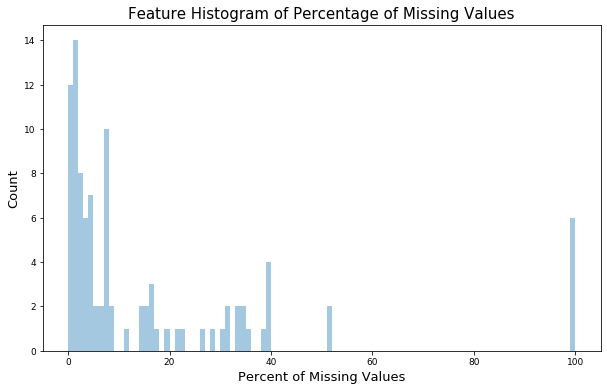

In [11]:
# Create a Histogram Plot of Percent Missing
plt.figure(figsize=(10,6))
sns.distplot(NA_check, kde = False, bins = 100);
plt.xlabel('Percent of Missing Values', fontsize=13)
plt.ylabel('Count', fontsize=13)
plt.yticks(fontsize=9)
plt.xticks(fontsize=9)
plt.title('Feature Histogram of Percentage of Missing Values', fontsize=15)
plt.show()

Initially screen out the datasets with greater than 10% missing data as there are still a large amount of features with <10% missing data.

In [12]:
NA_Percent_Threshold = 10
Remove_NA = NA_check < NA_Percent_Threshold
Data_2 = Data_1.copy()
Data_2 = Data_1.loc[:, Remove_NA]
print("Previous Number of columns:", Data_1.shape[1]) 
print("New Number of columns:", Data_2.shape[1])
print("Note that these include the outcome column")

Previous Number of columns: 98
New Number of columns: 63
Note that these include the outcome column


In [13]:
#If we want to drop columns to percent NA we can use the following (currently not being used)
# Data_1.loc[:, [x for x in Data_1.columns if (Data_1.loc[:, x].isnull().sum() / len(Data_1.loc[:, x])*100 > 50)]]

### Step 3: Infill NaN Values

Prior to dropping any rows or columns of data, infill missing values using two methods as follows:
  - Use the mean of the day of year
  - Use the mean of the month

These methods are used as streamflow is dependent on the time of year. Create two new datasets, one for each method.

In [14]:
# Generate copies of the datasets
Data_3a = Data_2.copy()
Data_3b = Data_2.copy()

In [15]:
# Impute values ussing the mean of the day of year
Data_3a.fillna(Data_3a.groupby('DayofYear').transform('mean'), inplace = True)

In [16]:
# Impute values using the mean of the month
Data_3b.fillna(Data_3b.groupby(Data_3b.index.month).transform('mean'), inplace = True)

Check for any remaining NaN values in these datasets:

In [17]:

Data_3a_na = Data_3a.isnull().sum().sum()
Data_3b_na = Data_3b.isnull().sum().sum()
print(Data_3a_na, Data_3b_na)

0 0


No null values left.

### Step 4: Add New Features Corresponding with Previous Values
Streamflow can be very dependent on forcings prior to the given date due to a lag time in effect. Therefore, create the following additional features for each current temperature, precipitation, or streamflow feature in the dataset:
- Previous 1-day value
- Previous 7-day mean

In [18]:
# Create the shifted by 1 day datasets
Data_3a_prev1 = Data_3a.copy().drop(columns=['DayofYear', '08MH147']).shift(periods=1)
Data_3a_prev1.columns = [str(col) + '_prev1' for col in Data_3a_prev1.columns]
Data_3b_prev1 = Data_3b.copy().drop(columns=['DayofYear', '08MH147']).shift(periods=1)
Data_3b_prev1.columns = [str(col) + '_prev1' for col in Data_3b_prev1.columns]

In [19]:
# Create the prevoius 7-day mean datasets
Data_3a_prev7 = Data_3a.copy().drop(columns=['DayofYear', '08MH147']).shift(periods=1).rolling(window=7, min_periods = 4).mean()
Data_3a_prev7.columns = [str(col) + '_prev7' for col in Data_3a_prev7.columns]
Data_3b_prev7 = Data_3b.copy().drop(columns=['DayofYear', '08MH147']).shift(periods=1).rolling(window=7, min_periods = 4).mean()
Data_3b_prev7.columns = [str(col) + '_prev7' for col in Data_3b_prev7.columns]

## Data Visualization
The following section explores visualizations of the dataset prior to modelling. Using "Data_2" which is the dataframe created from dropping features missing >10% of values but prior to infilling missing values.

### Correlation Plot

A correlation plot is provided below. Note that this is an interactive plot which is useful for exploration given the larges number of features.

In [20]:
Data_2_corr = Data_2.corr()

In [21]:
# Interactive correlation plot
fig = go.Figure(data=go.Heatmap(z = Data_2_corr, x=Data_2_corr.columns, y=Data_2_corr.index, colorscale = 'RdBu', zmid=0))
fig.update_layout(height = 800, xaxis_nticks=63, yaxis_nticks=63, autosize = True, title={
        'font':{'size':20},
        'text': "Correlation Plot",
        'y':0.92,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show(renderer="notebook")

The correlation plots indicates patterns between the features. This is not unexpected as:
- Many variables are max and min temperature from the same station
- Precipitation in the area will likely have a signal for any streamflow station, and 
- Streamflow stations with similar watershed characteristics will be affected by the similar features. 

While this indicates that feature reduction is  possible; for the sake of transparency of which specific features are most important to the model, feastures are currently not combined/reduced.

The correlation plot also shows that the outcome 08MH147 is more correlated with streamflow features compared with precipitation or temperature features. Therefore, streamflow features only could likely be for the study. However, other streamflow locations in British Columbia may have a less dense streamflow station network and analysis using precipitation and temperature may be more required.

### Pairplot
Also look at a pairplot of the 20 features most correlated with 08MH147.

In [22]:
Rank_corr = abs(Data_2_corr["08MH147"]).sort_values(ascending = False)
Rank_corr_20 = np.array(Rank_corr[0:20].index)

In [23]:
Data_2_Rank_20 = Data_2[Rank_corr_20]
Rank_corr_20

array(['08MH147', '08MH141', '08GA022', '08MH056', '08GA043', '08GA010',
       '08GA030', '08MH103', '08MH001', '08MG001', '08GA072', '08MH016',
       '08MF062', '08MG005', '08NL071', '08MF005', '08MH006', '837_mint',
       '776_mint', '698_mint'], dtype=object)

Most of the features are streamflow (denoted with the prefix 08) but the the last three features are minimum temperature features.

A pairplot is provided below showing the reltionship between these top 20 features. While the plot is busy and difficult to see any individual figure in detail, it can generally be seen that:
- Pairplots with 08MH147 are shows on the first row or first column. The 2nd and 3rd features (08MH141, 08GA022) are reasonably well correlated with 08MH147 but the other features have much less of a linear relationship. As such, it is expected that 08MH141 and 08GA022 will have high feature importance in modelling.
- There is also an interesting pattern in the relationship in the bottom three features (837_mint, 776_mint, 698_mint), which are all temperature features, in comparison with 08MH147. 
- It is also observed that the minimum temperature features are well correlated with each other which makes sense.

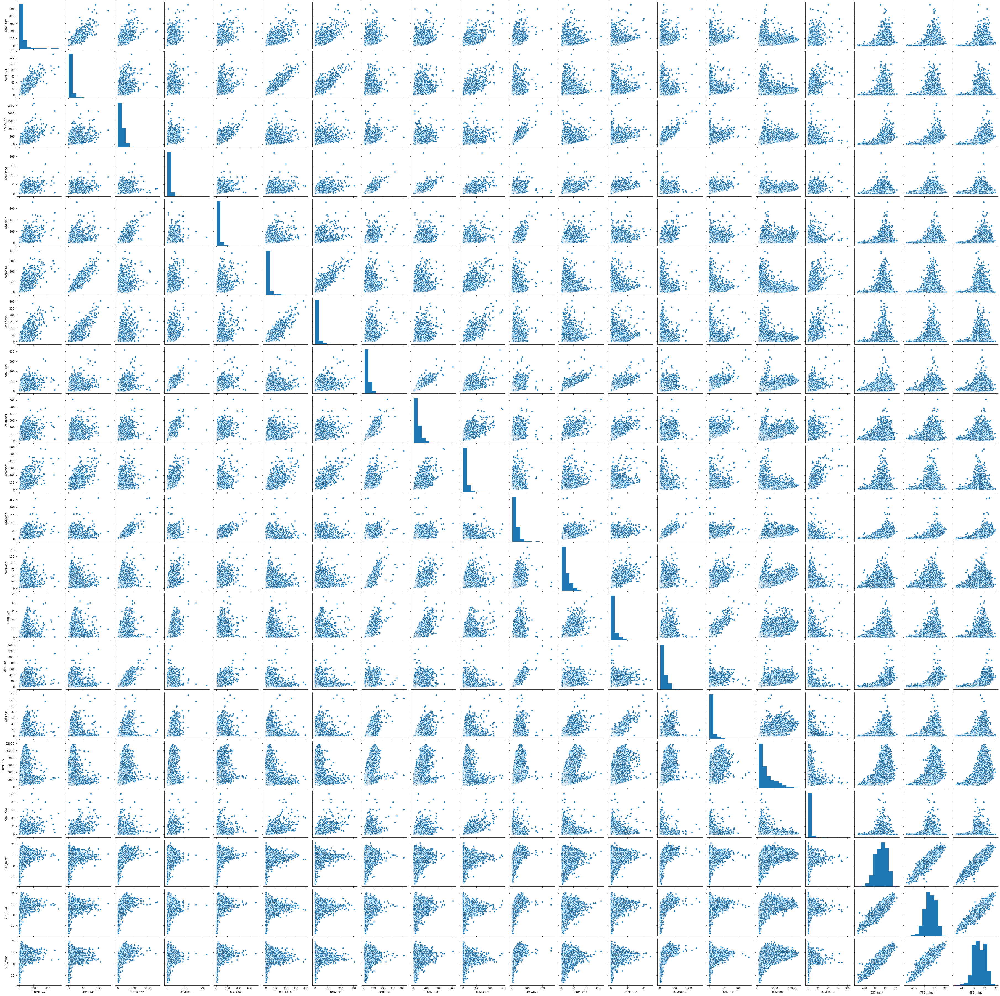

In [24]:
sns.pairplot(Data_2_Rank_20);

### Timeseries Plot

A timeseries data visualization is provided below of these 20 top correlated variables. Prior to plotting the data, each feature will be normailzed to the maximum and minimum values for comparison.

In [25]:
normalized_Data_2_Rank_20 = (Data_2_Rank_20-Data_2_Rank_20.min())/(Data_2_Rank_20.max()-Data_2_Rank_20.min())

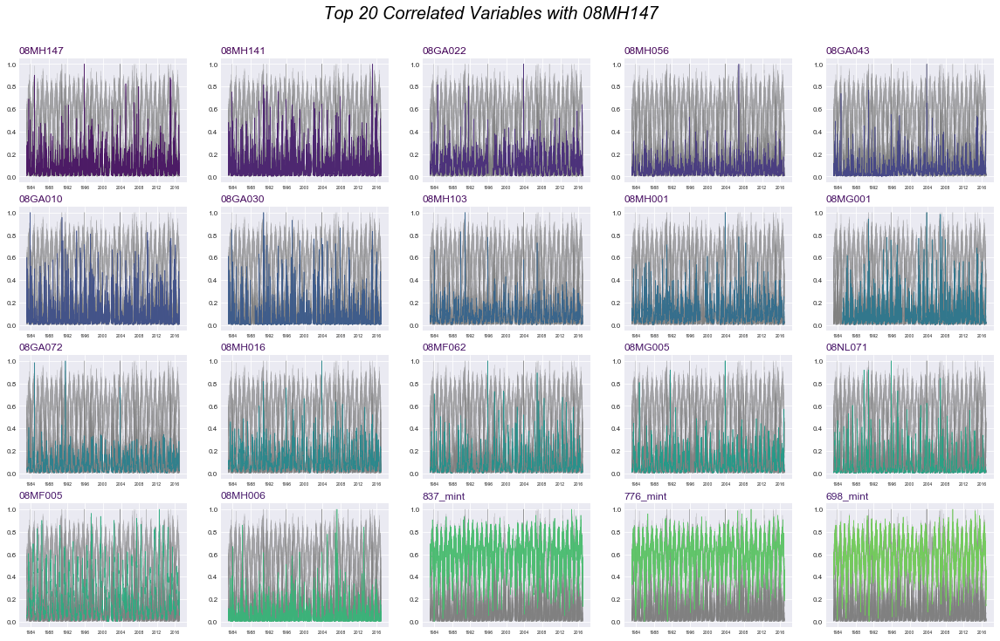

In [26]:
# Initialize the figure
plt.style.use('seaborn-darkgrid')
plt.subplots(figsize=(20, 12))

# create a color palette
cm = plt.get_cmap('viridis')
 
# multiple line plots in grid format
num=0
for column in normalized_Data_2_Rank_20:
    num+=1
 
    # Find the right spot on the plot
    plt.subplot(4,5, num)
 
    # plot all data on each subplot but in grey
    for v in normalized_Data_2_Rank_20:
        plt.plot(normalized_Data_2_Rank_20.index, normalized_Data_2_Rank_20[v], marker='', color='grey', linewidth=0.4, alpha=0.3)
 
    # Plot the single lineplot
    plt.plot(normalized_Data_2_Rank_20.index, normalized_Data_2_Rank_20[column], marker='', color=cm(num*10), linewidth=0.6, alpha=0.9)
    
    # Add title
    plt.title(column, loc='left', fontsize=12, fontweight=0, color=cm(num))
    plt.xticks(fontsize=5)
    plt.yticks(fontsize=8)
 
# general title
plt.suptitle("Top 20 Correlated Variables with 08MH147", fontsize=20, fontweight=0, color='black', style='italic', y=0.95);
 
# Axis title (currently not used)
#plt.text(0.5, 0.02, 'Time', ha='center', va='center')
#plt.text(0.06, 0.5, 'Note', ha='center', va='center', rotation='vertical')


The figure shows that:
- The first 17 plots are quite similar after being normalized, this makes sense as these are streamflow stations.
- However, while the streamflow series are similar, they are still unique with some having higher values less frequently than others.
- The last 3 plots represent temperature and are different from streamflow but similar to each other as is expected.

## Model Fitting - Step 1

Fit models to the datasets without the addition of the previous 1 day and 7 day feature dataframes that were created. This corresponds to only using Data_3a and Data_3b. Data_3a corresponds to the dataset infilling using day of year means while Data_3b corresponds to infilling using monthly means.

First create the model input datasets by removing the rows with missing values of the result: 08MH147.

In [27]:
Model_Data_3a = Data_3a[~NA_Mask]
Model_Data_3b = Data_3b[~NA_Mask]
print("Dataframes rows and columns: ", Model_Data_3a.shape, Model_Data_3b.shape)

Dataframes rows and columns:  (12064, 63) (12064, 63)


The datasets include 12064 rows of data and 63 columns of which one is 08MH146.  
Check for any missing values in these datasets.

In [28]:
Model_Data_3a_na = Model_Data_3a.isnull().sum().sum()
Model_Data_3b_na = Model_Data_3b.isnull().sum().sum()
print(Model_Data_3a_na, Model_Data_3b_na)

0 0


No missing values so partition the dataset into the outcome and the features in training and testing sets based on a 75% / 25% split.

In [29]:
np.random.seed(999)
Xa_tr, Xa_te, Ya_tr, Ya_te = model_selection.train_test_split(Model_Data_3a.drop(columns = '08MH147'), \
                                                              Model_Data_3a['08MH147'])
Xb_tr, Xb_te, Yb_tr, Yb_te = model_selection.train_test_split(Model_Data_3b.drop(columns = '08MH147'), \
                                                              Model_Data_3b['08MH147'])

Now fit a linear regression model, a random forest model, and a gradient boosting model to the datasets.

### Statistical Fit Tests
The following tests will be used to assess model fit: RMSE, MAE, and R2.  
A function is created to apply the statistical tests.

In [30]:
#Create a function to apply the three fit tests for the overall datasets as well as each quantile in the dataset
def performance(name, observed, modelled):
    output_RMSE = (metrics.mean_squared_error(observed, modelled))**(0.5)
    output_MAE = metrics.mean_absolute_error(observed, modelled)
    output_r2 = metrics.r2_score(observed, modelled)
    
    combine = [output_RMSE, output_MAE, output_r2]
        
    df = pd.DataFrame({name:combine}, index=['RMSE', 'MAE', 'R2'])

    return df

### Model Function

A model function is created to apply either a linear, random forest, or gradient boosting model.

In [31]:
def modelling(train_x, train_y, test_x, test_y, model_type, name):
    if model_type == "lm":
        model = linear_model.LinearRegression()
    elif model_type == "rf":
        model = RandomForestRegressor()
    elif model_type == "gb":
        model = GradientBoostingRegressor()
        
    model.fit(train_x, train_y)
    train_score = performance((name + " train"), train_y, model.predict(train_x))
    test_score = performance((name + " test"), test_y, model.predict(test_x))

    return train_score, test_score, model

### Linear Model

Fit a linear model and then conduct recursive feature selection and cross-validated (RFECV) selection to auto-reduce the best number of features.

In [32]:
lm_3a_tr_score, lm_3a_te_score, lm_3a = modelling(Xa_tr, Ya_tr, Xa_te, Ya_te, "lm", '3a')
lm_3b_tr_score, lm_3b_te_score, lm_3b = modelling(Xb_tr, Yb_tr, Xb_te, Yb_te, "lm", '3b')
lm_3_fit = pd.concat([lm_3a_tr_score, lm_3a_te_score, lm_3b_tr_score, lm_3b_te_score], axis= 1)
lm_3_fit

,3a train,3a test,3b train,3b test
RMSE,9.060,10.100,9.304,9.355
MAE,4.553,4.996,4.697,4.680
R2,0.934,0.917,0.932,0.924


The score of these initial models is slightly better for the 3b interpolation method dataset and the test scores are not that far below the training scores. 

Now look at feature reduction using RFECV.

In [33]:
lm_3a_temp = linear_model.LinearRegression()
lm_3b_temp = linear_model.LinearRegression()
lm_3a_rfecv = RFECV(estimator=lm_3a_temp)
lm_3b_rfecv = RFECV(estimator=lm_3b_temp)
lm_3a_rfecv.fit(Xa_tr, Ya_tr)
lm_3b_rfecv.fit(Xb_tr, Yb_tr)
print("Optimal number of features lm_3a_rfecv: %d (unreduced = 62)" % lm_3a_rfecv.n_features_)
print("Optimal number of features lm_3b_rfecv: %d (unreduced = 62)" % lm_3b_rfecv.n_features_)

Optimal number of features lm_3a_rfecv: 49 (unreduced = 62)
Optimal number of features lm_3b_rfecv: 43 (unreduced = 62)


Create updated input features (both for the training and test set) selected on the reduction above and rerun the linear models and assess performance.

In [34]:
Xa_tr_lmred = Xa_tr.loc[:,lm_3a_rfecv.support_]
Xa_te_lmred = Xa_te.loc[:,lm_3a_rfecv.support_]
Xb_tr_lmred = Xb_tr.loc[:,lm_3b_rfecv.support_]
Xb_te_lmred = Xb_te.loc[:,lm_3b_rfecv.support_]

In [35]:
lm_3a_tr_red_score, lm_3a_te_red_score, lm_3a_red = modelling(Xa_tr_lmred, Ya_tr, Xa_te_lmred, Ya_te, "lm", '3a_red')
lm_3b_tr_red_score, lm_3b_te_red_score, lm_3b_red = modelling(Xb_tr_lmred, Yb_tr, Xb_te_lmred, Yb_te, "lm", '3b_red')
lm_3_red_fit = pd.concat([lm_3a_tr_red_score, lm_3a_te_red_score, lm_3b_tr_red_score, lm_3b_te_red_score], axis= 1)
pd.concat([lm_3_fit, lm_3_red_fit], axis = 1)

,3a train,3a test,3b train,3b test,3a_red train,3a_red test,3b_red train,3b_red test
RMSE,9.060,10.100,9.304,9.355,9.085,10.166,9.328,9.379
MAE,4.553,4.996,4.697,4.680,4.581,5.023,4.717,4.694
R2,0.934,0.917,0.932,0.924,0.934,0.916,0.932,0.923


There is only minor performance loss in the reduced set feature set; therefore, recommend using the reduced set.

### Random Forest Model

Fit a random forest model just using the default settings for simplicity as this exercise is just to provide high-level identification of considerations for more in-depth analysis.

Performing RFECV on the Random Forest Model would be computationally expensive due to the large number of features so just use the feature importances attribute for feature reduction.


In [36]:
rf_3a_tr_score, rf_3a_te_score, rf_3a = modelling(Xa_tr, Ya_tr, Xa_te, Ya_te, "rf", '3a')
rf_3b_tr_score, rf_3b_te_score, rf_3b = modelling(Xb_tr, Yb_tr, Xb_te, Yb_te, "rf", '3b')
rf_3_fit = pd.concat([rf_3a_tr_score, rf_3a_te_score, rf_3b_tr_score, rf_3b_te_score], axis= 1)
rf_3_fit

,3a train,3a test,3b train,3b test
RMSE,3.421,9.987,3.481,9.753
MAE,1.403,4.112,1.446,3.780
R2,0.991,0.919,0.990,0.917


The random forest model is able to provide a much higher training fit compared with the linear model, but results in a higher reduction in fit to the test model results to a level similar to the linear models.

**Feature reduction**

In [37]:
rf_3a_imp = rf_3a.feature_importances_
rf_3b_imp = rf_3b.feature_importances_
# Select the top 10 features
rf_3a_indices_top10 = np.argsort(rf_3a_imp)[::-1][0:10]
rf_3b_indices_top10 = np.argsort(rf_3b_imp)[::-1][0:10]

# Print the feature ranking
print("Feature ranking:")
for f in range(10):
    print("%d. rf_3a: feature %s (%f), / rf_3b: feature %s (%f) " % (f + 1, 
                                            Xa_tr.columns[rf_3a_indices_top10[f]], 
                                            rf_3a_imp[rf_3a_indices_top10[f]],
                                            Xb_tr.columns[rf_3b_indices_top10[f]], 
                                            rf_3b_imp[rf_3b_indices_top10[f]]))

Feature ranking:
1. rf_3a: feature 08MH141 (0.668248), / rf_3b: feature 08MH141 (0.662753) 
2. rf_3a: feature 08GA022 (0.193222), / rf_3b: feature 08GA022 (0.191361) 
3. rf_3a: feature 08MF005 (0.035892), / rf_3b: feature 08MF005 (0.033591) 
4. rf_3a: feature 08MH056 (0.025000), / rf_3b: feature 08MH056 (0.029585) 
5. rf_3a: feature 08GA072 (0.008352), / rf_3b: feature 08MF062 (0.007415) 
6. rf_3a: feature 08GA043 (0.005126), / rf_3b: feature 08GA072 (0.005574) 
7. rf_3a: feature 951_mint (0.004265), / rf_3b: feature 08GA030 (0.003671) 
8. rf_3a: feature 08GA010 (0.003112), / rf_3b: feature 08MG005 (0.003238) 
9. rf_3a: feature 08MG001 (0.002564), / rf_3b: feature 08MH029 (0.002490) 
10. rf_3a: feature 08GA030 (0.002296), / rf_3b: feature 08GA043 (0.002472) 


The feature importance ranking above shows that 08MH141 and 08GA022 have a much higher importance than other features. While it may be able to drop all of the features except for these, this arbitrary selection method would not work will with an automatable or semi-automatable approach. Therefore, just drop any feature with less than 1% importance.

Also note that it is not suprising that 08MH141 and 08GA022 have much higher importance as they are the features that are most correlated with 08MH147.

Create the reduced feature training and test datasets.

In [38]:
Xa_tr_rfred = Xa_tr.loc[:,np.where(rf_3a_imp > 0.01, True, False)]
Xa_te_rfred = Xa_te.loc[:,np.where(rf_3a_imp > 0.01, True, False)]
Xb_tr_rfred = Xb_tr.loc[:,np.where(rf_3b_imp > 0.01, True, False)]
Xb_te_rfred = Xb_te.loc[:,np.where(rf_3b_imp > 0.01, True, False)]
print("Xa_rfred reduced to: %d (unreduced = 62)" % Xa_tr_rfred.shape[1])
print("Xb_rfred reduced to: %d (unreduced = 62)" % Xb_tr_rfred.shape[1])

Xa_rfred reduced to: 4 (unreduced = 62)
Xb_rfred reduced to: 4 (unreduced = 62)


In [39]:
rf_3a_tr_red_score, rf_3a_te_red_score, rf_3a_red = modelling(Xa_tr_rfred, Ya_tr, Xa_te_rfred, Ya_te, "rf", '3a_red')
rf_3b_tr_red_score, rf_3b_te_red_score, rf_3b_red = modelling(Xb_tr_rfred, Yb_tr, Xb_te_rfred, Yb_te, "rf", '3b_red')
rf_3_red_fit = pd.concat([rf_3a_tr_red_score, rf_3a_te_red_score, rf_3b_tr_red_score, rf_3b_te_red_score], axis= 1)
pd.concat([rf_3_fit, rf_3_red_fit], axis = 1)

,3a train,3a test,3b train,3b test,3a_red train,3a_red test,3b_red train,3b_red test
RMSE,3.421,9.987,3.481,9.753,3.659,10.578,3.635,10.070
MAE,1.403,4.112,1.446,3.780,1.625,4.629,1.659,4.287
R2,0.991,0.919,0.990,0.917,0.989,0.909,0.990,0.912


There is only minor performance loss between the reduced and unreduced feature models. Note that only using 4 features with the random forest model produces a fit only slightly lower than the 40+ feature linear models.

### Gradient Tree Boosting

Use the default settings for simplicity as this exercise is just to provide high-level identification of considerations for more in-depth analysis.

As for for the random forest model, performing RFECV would be computationally expensive due to the large number of features so just use the feature importances attribute for feature reduction.

In [40]:
gb_3a_tr_score, gb_3a_te_score, gb_3a = modelling(Xa_tr, Ya_tr, Xa_te, Ya_te, "gb", '3a')
gb_3b_tr_score, gb_3b_te_score, gb_3b = modelling(Xb_tr, Yb_tr, Xb_te, Yb_te, "gb", '3b')
gb_3_fit = pd.concat([gb_3a_tr_score, gb_3a_te_score, gb_3b_tr_score, gb_3b_te_score], axis= 1)
gb_3_fit

,3a train,3a test,3b train,3b test
RMSE,5.798,10.196,6.035,9.484
MAE,3.516,4.488,3.614,4.220
R2,0.973,0.915,0.971,0.922


Similar to the random forest model, the gradient tree boosting model is able to provide a much higher training fit compared with the linear model, but results in a higher reduction in fit to the test model results to a level similar to the linear models.

**Feature reduction**

In [41]:
gb_3a_imp = gb_3a.feature_importances_
gb_3b_imp = gb_3b.feature_importances_
# Select the top 10 features
gb_3a_indices_top10 = np.argsort(gb_3a_imp)[::-1][0:10]
gb_3b_indices_top10 = np.argsort(gb_3b_imp)[::-1][0:10]

# Print the feature ranking
print("Feature ranking:")
for f in range(10):
    print("%d. gb_3a: feature %s (%f), / gb_3b: feature %s (%f) " % (f + 1, 
                                            Xa_tr.columns[gb_3a_indices_top10[f]], 
                                            gb_3a_imp[gb_3a_indices_top10[f]],
                                            Xb_tr.columns[gb_3b_indices_top10[f]], 
                                            gb_3b_imp[gb_3b_indices_top10[f]]))

Feature ranking:
1. gb_3a: feature 08MH141 (0.638554), / gb_3b: feature 08MH141 (0.647255) 
2. gb_3a: feature 08GA022 (0.220439), / gb_3b: feature 08GA022 (0.211734) 
3. gb_3a: feature 08MH056 (0.056163), / gb_3b: feature 08MH056 (0.060474) 
4. gb_3a: feature 08MF005 (0.033086), / gb_3b: feature 08MF005 (0.022389) 
5. gb_3a: feature 08GA043 (0.009767), / gb_3b: feature 08GA072 (0.007549) 
6. gb_3a: feature 08GA030 (0.005588), / gb_3b: feature 08GA043 (0.006981) 
7. gb_3a: feature 08GA072 (0.005515), / gb_3b: feature 08MF062 (0.006253) 
8. gb_3a: feature 08NL071 (0.004206), / gb_3b: feature 08NL071 (0.003772) 
9. gb_3a: feature 951_mint (0.002846), / gb_3b: feature 08GA010 (0.003124) 
10. gb_3a: feature 716_maxt (0.002421), / gb_3b: feature 08MG001 (0.002070) 


The feature ranking has the same results as the random forest model with 08MH141 and 08GA022 having a much higher importance than other features. As per the random forest reduction method, drop any feature with less than 1% importance.

In [42]:
Xa_tr_gbred = Xa_tr.loc[:,np.where(gb_3a_imp > 0.01, True, False)]
Xa_te_gbred = Xa_te.loc[:,np.where(gb_3a_imp > 0.01, True, False)]
Xb_tr_gbred = Xb_tr.loc[:,np.where(gb_3b_imp > 0.01, True, False)]
Xb_te_gbred = Xb_te.loc[:,np.where(gb_3b_imp > 0.01, True, False)]
print("Xa_gbred reduced to: %d (unreduced = 62)" % Xa_tr_gbred.shape[1])
print("Xb_gbred reduced to: %d (unreduced = 62)" % Xb_tr_gbred.shape[1])

Xa_gbred reduced to: 4 (unreduced = 62)
Xb_gbred reduced to: 4 (unreduced = 62)


In [43]:
gb_3a_tr_red_score, gb_3a_te_red_score, gb_3a_red = modelling(Xa_tr_gbred, Ya_tr, Xa_te_gbred, Ya_te, "gb", '3a_red')
gb_3b_tr_red_score, gb_3b_te_red_score, gb_3b_red = modelling(Xb_tr_gbred, Yb_tr, Xb_te_gbred, Yb_te, "gb", '3b_red')
gb_3_red_fit = pd.concat([gb_3a_tr_red_score, gb_3a_te_red_score, gb_3b_tr_red_score, gb_3b_te_red_score], axis= 1)
pd.concat([gb_3_fit, gb_3_red_fit], axis = 1)

,3a train,3a test,3b train,3b test,3a_red train,3a_red test,3b_red train,3b_red test
RMSE,5.798,10.196,6.035,9.484,6.893,10.355,7.243,9.788
MAE,3.516,4.488,3.614,4.220,3.898,4.771,4.035,4.393
R2,0.973,0.915,0.971,0.922,0.962,0.913,0.959,0.916


### Comparison

The following table presents the fit tests from all of the models runs, using the reduced feature models:

In [44]:
Step1_fit = pd.concat([lm_3_red_fit, rf_3_red_fit, gb_3_red_fit], keys=['lm', 'rf', 'gb'])
Step1_fit

3a_red train  3a_red test  3b_red train  3b_red test
lm RMSE         9.085       10.166         9.328        9.379
   MAE          4.581        5.023         4.717        4.694
   R2           0.934        0.916         0.932        0.923
rf RMSE         3.659       10.578         3.635       10.070
   MAE          1.625        4.629         1.659        4.287
   R2           0.989        0.909         0.990        0.912
gb RMSE         6.893       10.355         7.243        9.788
   MAE          3.898        4.771         4.035        4.393
   R2           0.962        0.913         0.959        0.916

The comparison of results indicates the following:
- In every test set, the 3b models slightly outperform the 3a models in every fit metric; therefore, it is recommended to use the 3b method for infilling (mean monthly value) instead of the 3a method (mean day of year value).
- The linear model has the least decrease in performance from training to testing sets and appears to have slightly better performance compared with the random forest and gradient boosting models; however, all three methods are generally similar.
- The random forests and gradient boosting model feature reduction methods resulted in only 4 remaining features compared with 40+ features for the linear model. However, this could just be due to the linear model reduction method and it may be possible to achieve similar performance with a further reduced parameter set for a linear model.

## Model Fitting - Step 2

Fit models to the datasets with the addition of the previous 1 day and 7 day dataframes that were created. This corresponds to adding the prev1 and prev7 datasets to Data_3b. Only use use the Data_3b datasets based on the conclusion of the section above.

Remove the rows with missing values of the result: 08MH147.

In [45]:
Model_Data_3b_prev = pd.concat([Data_3b, Data_3b_prev1, Data_3b_prev7], axis = 1)[~NA_Mask]
print("Dataset rows and columns: ", Model_Data_3b_prev.shape)

Dataset rows and columns:  (12064, 185)


The datasets include 12064 rows of data (same as in Model Fitting - Step 1) and 185 columns due to the addition of the previous value dataframes.  

Check for any missing values in these dataset.

In [46]:
Model_Data_3b_prev_na = Model_Data_3b_prev.isnull().sum().sum()
print(Model_Data_3b_prev_na)

122


These na values are due to creating the previous 1 day and previous 7 day values, as they represent a minor amount of data, just drop the rows.

In [47]:
Model_Data_3b_prev.dropna(inplace = True)

Now partition the dataset into the outcome and the features in training and testing sets based on a 75% / 25% split.

In [48]:
np.random.seed(998)
Xb_prev_tr, Xb_prev_te, Yb_prev_tr, Yb_prev_te = model_selection.train_test_split(Model_Data_3b_prev.drop(columns = '08MH147'), \
                                                              Model_Data_3b_prev['08MH147'])

### Linear, Random Forest, and Gradient Boosting Modelling
Fitting the models follows the same process as above.

In [49]:
# Fit unreduced feature linear models
lm_3b_prev_tr_score, lm_3b_prev_te_score, lm_3b_prev = \
modelling(Xb_prev_tr, Yb_prev_tr, Xb_prev_te, Yb_prev_te, "lm", '3b_prev')
lm_3_prev_fit = pd.concat([lm_3b_prev_tr_score, lm_3b_prev_te_score], axis= 1)

# Use RFECV to reduce features
lm_3b_prev_temp = linear_model.LinearRegression()
lm_3b_prev_rfecv = RFECV(estimator=lm_3b_prev_temp)
lm_3b_prev_rfecv.fit(Xb_prev_tr, Yb_prev_tr)
Xb_prev_tr_lmred = Xb_prev_tr.loc[:,lm_3b_prev_rfecv.support_]
Xb_prev_te_lmred = Xb_prev_te.loc[:,lm_3b_prev_rfecv.support_]

# Fit reduced feature linear models
lm_3b_prev_tr_red_score, lm_3b_prev_te_red_score, lm_3b_prev_red = \
modelling(Xb_prev_tr_lmred, Yb_prev_tr, Xb_prev_te_lmred, Yb_prev_te, "lm", '3b_prev_red')
lm_3_prev_red_fit = pd.concat([lm_3b_prev_tr_red_score, lm_3b_prev_te_red_score], axis= 1)

lm_3_prev_red_fit1 = pd.concat([lm_3b_tr_red_score, lm_3b_te_red_score, lm_3b_prev_tr_red_score, \
                                lm_3b_prev_te_red_score], axis= 1)
pd.concat([lm_3_prev_fit, lm_3_prev_red_fit], axis = 1)

,3b_prev train,3b_prev test,3b_prev_red train,3b_prev_red test
RMSE,8.544,9.122,8.551,9.133
MAE,4.484,4.473,4.495,4.486
R2,0.943,0.928,0.942,0.928


In [50]:
# Fit unreduced feature random forest models
rf_3b_prev_tr_score, rf_3b_prev_te_score, rf_3b_prev = \
modelling(Xb_prev_tr, Yb_prev_tr, Xb_prev_te, Yb_prev_te, "rf", '3b_prev')
rf_3_prev_fit = pd.concat([rf_3b_prev_tr_score, rf_3b_prev_te_score], axis= 1)

# Use feature importance to reduce features
rf_3b_prev_imp = rf_3b_prev.feature_importances_
Xb_prev_tr_rfred = Xb_prev_tr.loc[:,np.where(rf_3b_prev_imp > 0.01, True, False)]
Xb_prev_te_rfred = Xb_prev_te.loc[:,np.where(rf_3b_prev_imp > 0.01, True, False)]

# Fit reduced feature random forest models
rf_3b_prev_tr_red_score, rf_3b_prev_te_red_score, rf_3b_prev_red = \
modelling(Xb_prev_tr_rfred, Yb_prev_tr, Xb_prev_te_rfred, Yb_prev_te, "rf", '3b_prev_red')
rf_3_prev_red_fit = pd.concat([rf_3b_prev_tr_red_score, rf_3b_prev_te_red_score], axis= 1)

rf_3_prev_red_fit1 = pd.concat([rf_3b_tr_red_score, rf_3b_te_red_score, rf_3b_prev_tr_red_score, \
                                rf_3b_prev_te_red_score], axis= 1)
pd.concat([rf_3_prev_fit, rf_3_prev_red_fit], axis = 1)

,3b_prev train,3b_prev test,3b_prev_red train,3b_prev_red test
RMSE,3.562,9.389,3.728,9.741
MAE,1.422,3.665,1.650,4.223
R2,0.990,0.923,0.989,0.918


In [51]:
# Fit unreduced feature gradient boosting models
gb_3b_prev_tr_score, gb_3b_prev_te_score, gb_3b_prev = \
modelling(Xb_prev_tr, Yb_prev_tr, Xb_prev_te, Yb_prev_te, "gb", '3b_prev')
gb_3_prev_fit = pd.concat([gb_3b_prev_tr_score, gb_3b_prev_te_score], axis= 1)

# Use feature importance to reduce features
gb_3b_prev_imp = gb_3b_prev.feature_importances_
Xb_prev_tr_gbred = Xb_prev_tr.loc[:,np.where(gb_3b_prev_imp > 0.01, True, False)]
Xb_prev_te_gbred = Xb_prev_te.loc[:,np.where(gb_3b_prev_imp > 0.01, True, False)]

# Fit reduced feature gradient boosting models
gb_3b_prev_tr_red_score, gb_3b_prev_te_red_score, gb_3b_prev_red = \
modelling(Xb_prev_tr_gbred, Yb_prev_tr, Xb_prev_te_gbred, Yb_prev_te, "gb", '3b_prev_red')
gb_3_prev_red_fit = pd.concat([gb_3b_prev_tr_red_score, gb_3b_prev_te_red_score], axis= 1)

gb_3_prev_red_fit1 = pd.concat([gb_3b_tr_red_score, gb_3b_te_red_score, gb_3b_prev_tr_red_score, \
                                gb_3b_prev_te_red_score], axis= 1)
pd.concat([gb_3_prev_fit, gb_3_prev_red_fit], axis = 1)

,3b_prev train,3b_prev test,3b_prev_red train,3b_prev_red test
RMSE,5.561,9.185,6.968,9.479
MAE,3.397,4.088,3.939,4.327
R2,0.976,0.927,0.962,0.922


### Comparison
The following table presents the fit tests from all of the models runs using the datasets that include the previous values and the reduced feature models.

The table also shows the models from Step 1 that did not include the previous values.

In [52]:
Step2_fit = pd.concat([lm_3_prev_red_fit1, rf_3_prev_red_fit1, gb_3_prev_red_fit1], keys=['lm', 'rf', 'gb'])
Step2_fit

3b_red train  3b_red test  3b_prev_red train  3b_prev_red test
lm RMSE         9.328        9.379              8.551             9.133
   MAE          4.717        4.694              4.495             4.486
   R2           0.932        0.923              0.942             0.928
rf RMSE         3.635       10.070              3.728             9.741
   MAE          1.659        4.287              1.650             4.223
   R2           0.990        0.912              0.989             0.918
gb RMSE         7.243        9.788              6.968             9.479
   MAE          4.035        4.393              3.939             4.327
   R2           0.959        0.916              0.962             0.922

The comparison of results indicates the following:
- The three model types have similar performance. The linear model again has slightly better performance but the difference in performance between the three model types is less than the difference observed in Step 1.
- There is slightly better performance in all metrics for the models that use the previous values dataset in comparison with the models that do not. However, it should be recognized that the training and testing set was resplit between Step 1 and Step 2; therefore, the relatively small difference could be due to this.

## Results

Based on the Step 1 and Step 2 modelling results presented in the above section, it appears that:
- Infilling using the monthly means results in a slightly better result compared with infilling using day of year means.
- The Step 2 modelling which uses the datasets with previous values have a potentially slightly better performance than Step 1 modelling that uses datasets without the previous values.
- The linear models have a slightly better fit based on the metrics used to assess fit, however the performance between the three methods is very similar.
- The random forest and gradient boosting model feature reduction methods resulted in a much lower number of features compared with the linear model feature reduction method; however, this does not mean that the features could not be further reduced in the linear model.

Due to the similarity in the results of the three model types, the assessment below looks at fit within 0.1 increment quantiles to see if any of the models have a better fit from that perspective. As the Step 2 modelling resulted in the best fit, only compare those models during this assessment and only look at the test set results.

In [53]:
#Create a function to apply the three fit tests for the overall datasets as well as each quantile in the dataset
def performance_quantile(observed, modelled):
    labels = ['All_Data', 'Q0_0.1', 'Q0.1_0.2', 'Q0.2_0.3', 'Q0.3_0.4', 'Q0.4_0.5', 'Q0.5_0.6', 'Q0.6_0.7', 'Q0.7_0.8',
              'Q0.8_0.9', 'Q0.9_1.0']
    output_RMSE = []
    output_MAE = []
    output_r2 = []
    output_RMSE.append((metrics.mean_squared_error(observed, modelled))**(0.5))
    output_MAE.append(metrics.mean_absolute_error(observed, modelled))
    output_r2.append(metrics.r2_score(observed, modelled))
    quantiles = np.arange(0.1,1.1,0.1)
    for idx, val in enumerate(quantiles):
        lower = observed.quantile(val-0.1)
        upper = observed.quantile(val)
        quantile_mask = np.where((observed < upper) & (observed >= lower), True, False)
        observed_quantile = observed[quantile_mask]
        modelled_quantile = modelled[quantile_mask]
        output_RMSE.append((metrics.mean_squared_error(observed_quantile, modelled_quantile))**(0.5))
        output_MAE.append(metrics.mean_absolute_error(observed_quantile, modelled_quantile))
        output_r2.append(metrics.r2_score(observed_quantile, modelled_quantile))
        
    df = pd.DataFrame(columns=labels, index=['RMSE', 'MAE', 'R2'])
    df.iloc[0] = output_RMSE
    df.iloc[1] = output_MAE
    df.iloc[2] = output_r2
                      
    return df

In [54]:
print("linear model")
performance_quantile(Yb_prev_te, lm_3b_prev_red.predict(Xb_prev_te_lmred))

linear model


,All_Data,Q0_0.1,Q0.1_0.2,Q0.2_0.3,Q0.3_0.4,Q0.4_0.5,Q0.5_0.6,Q0.6_0.7,Q0.7_0.8,Q0.8_0.9,Q0.9_1.0
RMSE,9.13,2.53,2.6,3.22,4.21,4.8,5.59,7.09,6.66,8.97,22.2
MAE,4.49,1.85,1.99,2.3,2.83,3.32,3.71,4.33,5.04,6.3,12.7
R2,0.928,-5.17,-9.37,-6.84,-10.1,-10,-7.21,-4.26,-2.42,-1.97,0.778


In [55]:
print("random forest model")
performance_quantile(Yb_prev_te, rf_3b_prev_red.predict(Xb_prev_te_rfred))

random forest model


,All_Data,Q0_0.1,Q0.1_0.2,Q0.2_0.3,Q0.3_0.4,Q0.4_0.5,Q0.5_0.6,Q0.6_0.7,Q0.7_0.8,Q0.8_0.9,Q0.9_1.0
RMSE,9.74,1.25,1.84,2.62,4.24,4.38,5.52,7.66,7.39,8.62,24.5
MAE,4.22,0.701,1.17,1.76,2.46,2.91,3.43,4.86,5.41,5.58,13.4
R2,0.918,-0.507,-4.2,-4.22,-10.3,-8.2,-7.01,-5.15,-3.21,-1.74,0.729


In [56]:
print("gradient boosting model")
performance_quantile(Yb_prev_te, gb_3b_prev_red.predict(Xb_prev_te_gbred))

gradient boosting model


,All_Data,Q0_0.1,Q0.1_0.2,Q0.2_0.3,Q0.3_0.4,Q0.4_0.5,Q0.5_0.6,Q0.6_0.7,Q0.7_0.8,Q0.8_0.9,Q0.9_1.0
RMSE,9.48,1.24,1.69,3.17,4.15,4.87,5.58,7.81,6.66,8.49,24
MAE,4.33,0.949,1.14,1.96,2.81,3.27,3.58,5.01,5.01,5.44,13.6
R2,0.922,-0.491,-3.4,-6.61,-9.8,-10.3,-7.2,-5.4,-2.42,-1.66,0.741


The quantile performance assessment is interesting as it shows that the R2 fit is generally poor within any given quantile. This indicates that while the models are good at capturing the overal relationship from the minimum to maximum range of streamflow, there is less correlation within each quantile. The table also indicates that the random forest model generally performs better in terms of MSE and MAE within each quantile.

The following section provides plots of the quantiles for a visual assessment of fit.

Create a dataframe of observed and modelled results for the plots.

In [57]:
Results_df = pd.DataFrame(Yb_prev_te).rename(columns={"08MH147": "Observed"})
Results_df['Modelled_lm'] = lm_3b_prev_red.predict(Xb_prev_te_lmred)
Results_df['Modelled_rf'] = rf_3b_prev_red.predict(Xb_prev_te_rfred)
Results_df['Modelled_gb'] = gb_3b_prev_red.predict(Xb_prev_te_gbred)
Results_df.sort_index(inplace = True)
Results_df.head()

,Observed,Modelled_lm,Modelled_rf,Modelled_gb
Date,,,,
1983-02-08,6.30,8.285,8.729,8.120
1983-02-09,6.34,4.637,9.794,8.856
1983-02-12,155.00,142.436,166.510,163.669
1983-02-20,28.40,27.679,41.317,39.239
1983-02-21,18.20,13.100,20.239,21.485


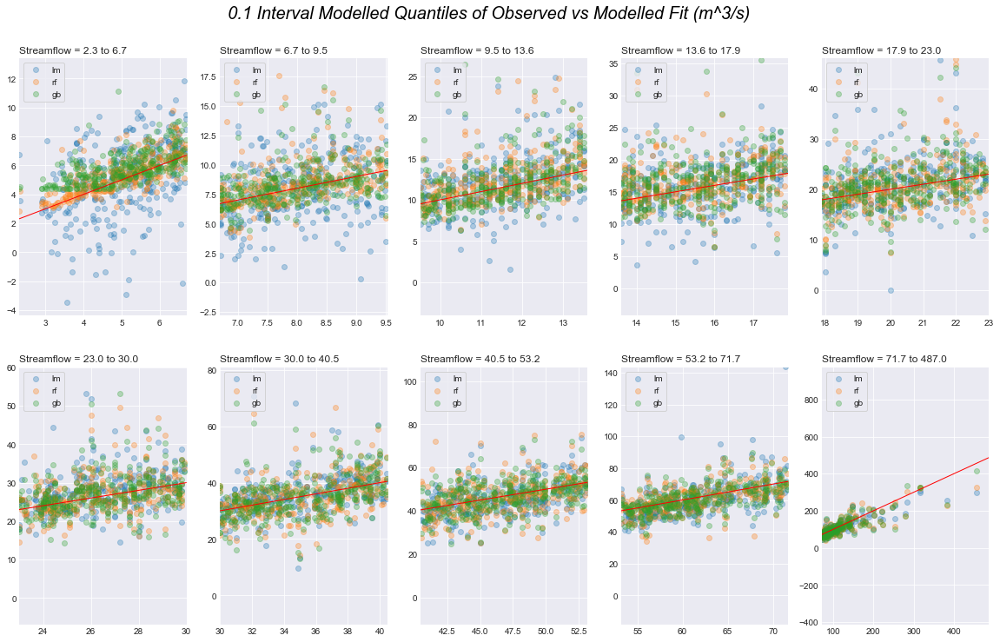

In [58]:
# Create modelled vs observed quantile plots
plt.style.use('seaborn-darkgrid')
plt.subplots(figsize=(20, 12))

observed_plot = Results_df['Observed']
modelled1_plot = Results_df['Modelled_lm']
modelled2_plot = Results_df['Modelled_rf']
modelled3_plot = Results_df['Modelled_gb']

quantiles = np.arange(0.1,1.1,0.1)
for idx, val in enumerate(quantiles):
    lower = observed_plot.quantile(val-0.1)
    upper = observed_plot.quantile(val)
    quantile_mask = np.where((observed_plot < upper) & (observed_plot >= lower), True, False)
    observed_quantile = observed_plot[quantile_mask]
    modelled1_quantile = modelled1_plot[quantile_mask]
    modelled2_quantile = modelled2_plot[quantile_mask]
    modelled3_quantile = modelled3_plot[quantile_mask]
    range_val = np.arange(lower, upper, (upper-lower)/1000) 
    
    # Find the right spot on the plot
    plt.subplot(2, 5, idx+1)

    # Plotting
    plt.scatter(observed_quantile, modelled1_quantile, alpha=0.3, label = 'lm')
    plt.scatter(observed_quantile, modelled2_quantile, alpha=0.3, label = 'rf')
    plt.scatter(observed_quantile, modelled3_quantile, alpha=0.3, label = 'gb')
    plt.plot(range_val, range_val, color='red', marker='', linewidth=1.0)

    # Add title and formatting
    plt.title("Streamflow = " + str(round(lower, 1)) + " to " + str(round(upper,1)), loc='left', fontsize=12, fontweight=0)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlim(left = lower, right = upper)
    plt.ylim(bottom = lower-upper, top = upper*2)
    
    plt.legend(loc = 2, frameon=True)

# general title
plt.suptitle("0.1 Interval Modelled Quantiles of Observed vs Modelled Fit (m^3/s)", fontsize=20, fontweight=0, color='black', style='italic', y=0.95);


The plot above showing the observed vs modelled data indicates that while there is a large amount of scatter within each quantile, the random forest (rf) and gradient boosting (gb) models have a tigher fit to the 1:1 line compared with the linear model. The first quantile plot in the series also shows that the linear model results in negative streamflow estimates whereas the rf and gb models do not.

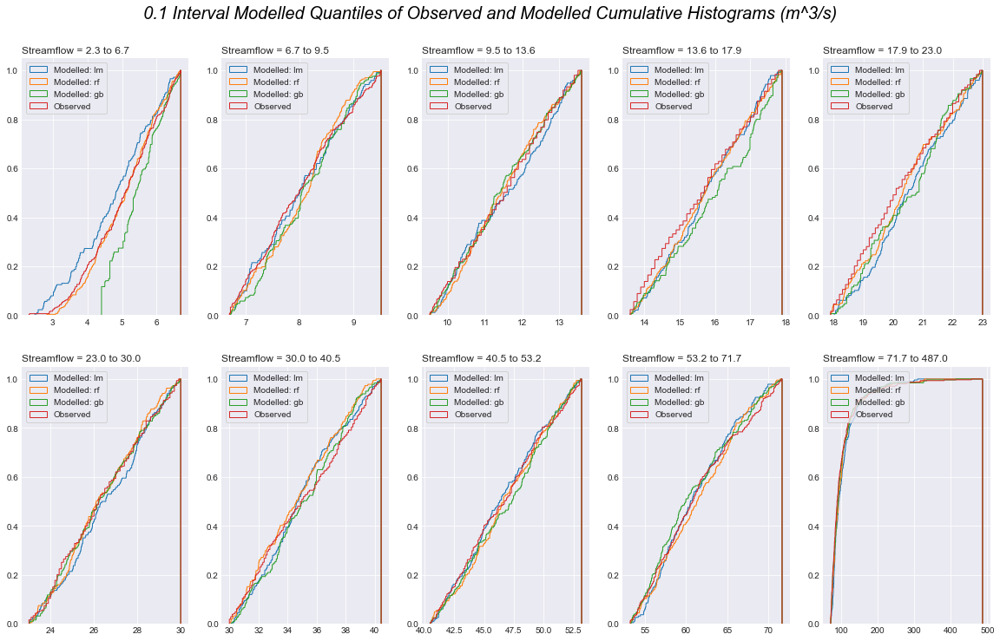

In [59]:
# Create modelled and observed quantile histogram plots
plt.style.use('seaborn-darkgrid')
plt.subplots(figsize=(20, 12))

for idx, val in enumerate(quantiles):
    lower = observed_plot.quantile(val-0.1)
    upper = observed_plot.quantile(val)
    quantile_mask = np.where((observed_plot < upper) & (observed_plot >= lower), True, False)
    observed_quantile_h = observed_plot[quantile_mask]
    modelled1_quantile_h = modelled1_plot[quantile_mask]
    modelled2_quantile_h = modelled2_plot[quantile_mask]
    modelled3_quantile_h = modelled3_plot[quantile_mask]
    range_val_h = np.arange(lower, upper, (upper-lower)/1000)
    
    # Find the right spot on the plot
    plt.subplot(2, 5, idx+1)

    # Plot the histogram
    plt.hist(modelled1_quantile_h, bins=range_val_h, density=True, histtype='step', cumulative=True,
        label='Modelled: lm')
    plt.hist(modelled2_quantile_h, bins=range_val_h, density=True, histtype='step', cumulative=True,
        label='Modelled: rf')
    plt.hist(modelled3_quantile_h, bins=range_val_h, density=True, histtype='step', cumulative=True,
        label='Modelled: gb')
    plt.hist(observed_quantile_h, bins = range_val_h, density=True, histtype='step', cumulative=True, 
             label='Observed')

    # Add title and formatting
    plt.title("Streamflow = " + str(round(lower, 1)) + " to " + str(round(upper,1)), loc='left', fontsize=12, fontweight=0)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    
    plt.legend(loc = 2, frameon=True)

# general title
plt.suptitle("0.1 Interval Modelled Quantiles of Observed and Modelled Cumulative Histograms (m^3/s)", fontsize=20, fontweight=0, color='black', style='italic', y=0.95);

The quantile histogram plots indicate that the random forest (rf) model appears to have the best fit to the observed data. The linear model (lm) and gradient boosting models (gb) perform particulary poorly in comparison with the first quantile plot in the series.

In [60]:
# Create interactive time series plot
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=list(Results_df.index), y=list(Results_df.Observed), name="Observed", line_color="Red"))

fig.add_trace(
    go.Scatter(x=list(Results_df.index), y=list(Results_df.Modelled_lm), name="Modelled: lm", line_color="Blue"))

fig.add_trace(
    go.Scatter(x=list(Results_df.index), y=list(Results_df.Modelled_rf), name="Modelled: rf", line_color="Orange"))

fig.add_trace(
    go.Scatter(x=list(Results_df.index), y=list(Results_df.Modelled_gb), name="Modelled: gb", line_color="Green"))

# Set title
fig.update_layout(title={
                    'font':{'size':20},
                    'text': "Time Series of Observed and Modelled Streamflow Data (m^3/s)",
                    'y':0.92,
                    'x':0.5,
                    'xanchor': 'center',
                    'yanchor': 'top'}
)

# style all the traces
fig.update_traces(
    #hoverinfo="name+x+text",
    line={"width": 0.5},
    mode="lines"
)

#fig.update_layout(
#   xaxis=dict(
#        rangeslider=dict(
#            visible=True
#        ),
#        type="date"
#    )
#)

fig.show(renderer="notebook")

Zooming into lower flows on the plot highlights that the random forest model outperforms the linear and gradient boosting models. The plot also indicates that the observed peak flows are generally higher than the modelled peak flows.

## Conclusions
- **Overall objective**:
 - The models were able to provide a reasonable fit for streamflow at Stave River (08MH147) and the exercise indicates that using an automated or semi-automated approach to estimate streamflow at stations in British Columbia may be feasible.
- **Data preprocessing**: 
 - Infilling missing data using the monthly means results in a slightly better result compared with infilling using day of year means.
 - Generating datasets with previous values for modelling potentially improves model results.
- **Model fit**:
 - While the linear model has a slightly better overall fit, the random forest model has a better model fit when considering the performance metrics within 0.1 increment quantiles as well as the plot visualizations. More specifically, in the 0.1 quantile (corresonding the lower streamflow values) the random forest model has a much better fit. Therefore, the **random forest model** appears to provide the best result.

This initial study provides a good first step towards utilizing machine learning models for streamflow in British Columbia but additional study should be considered including assessing:
- Locations within different regions of the province.
- Models utilizing sparser regionally available datasets.
- The impact in the reduction of data record length (i.e., what is the minimum length of record required by the model to perform adequately).
- Review of other machine learning models and/or the tuning of model parameters (defaults were used in this study).
- Comparison of accuracy with existing methods such as Empirical Frequency Pairing.



